# Desktop Before

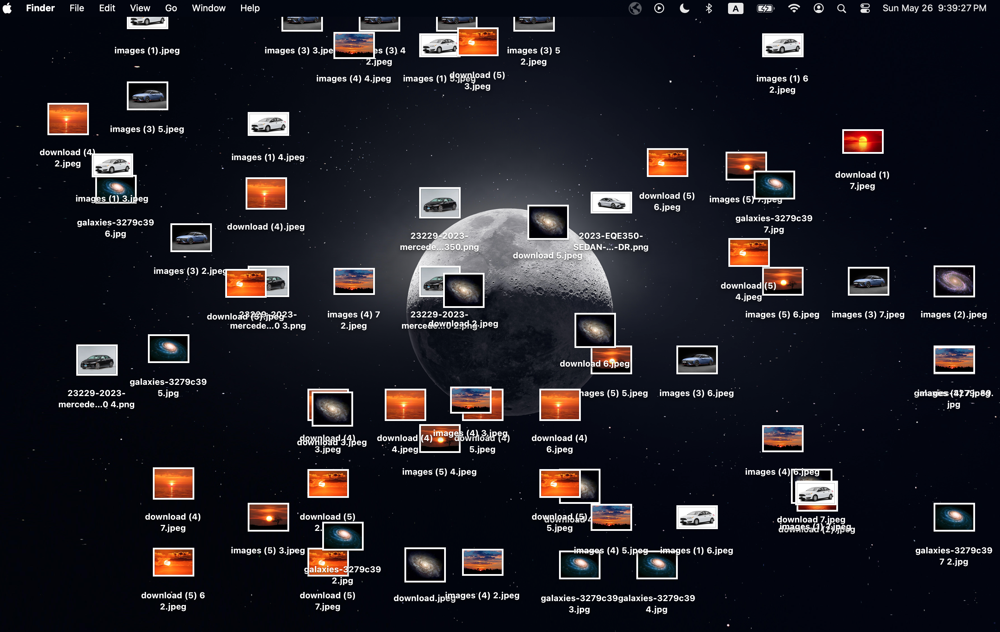

# Vector Embedding using CLIP

#### Import libraries

In [1]:
import numpy as np
from transformers import CLIPProcessor, CLIPModel
import torch
from PIL import Image

import warnings
warnings.filterwarnings('ignore')

#### Retrieve the pre-trained model

In [2]:
model = CLIPModel.from_pretrained("openai/clip-vit-large-patch14")
processor = CLIPProcessor.from_pretrained("openai/clip-vit-large-patch14")

#### Retrieve only the image type files on Desktop

In [3]:
import os

Function that returns True if image and False if not an image:

In [4]:
def is_image_file(file_name):
    
    valid_extensions = {'.jpg', '.jpeg', '.png', '.gif', '.bmp', '.tiff'}
    
    file_extension = os.path.splitext(file_name)[1].lower()
    
    return file_extension in valid_extensions

Retrieve all the files in the desktop and store in an array 'files'. For each file we check if its an image, if not then we remove from the array:

In [5]:
desktop_path = os.path.join(os.path.expanduser("~"), "Desktop")

files = os.listdir(desktop_path)

for file_name in files:
    file_path = os.path.join(desktop_path, file_name)
    
    if not is_image_file(file_name):
        files.remove(file_name)

In [6]:
print("Number of files: " + str(len(files)))

Number of files: 69


In [7]:
print("The files: ")
print(files)

The files: 
['images (4) 4.jpeg', 'download (5).jpeg', 'images (2).jpeg', 'download.jpeg', 'galaxies-3279c39 7 2.jpg', 'images (1) 7.jpeg', 'images (5) 5.jpeg', 'download (4) 5.jpeg', 'download (5) 4.jpeg', 'download (5) 5.jpeg', 'download (5) 6 2.jpeg', 'images (4).jpeg', 'download (1) 7.jpeg', 'download (4) 4.jpeg', 'images (5) 4.jpeg', 'images (1) 6.jpeg', 'galaxies-3279c39.jpg', 'images (3) 4 2.jpeg', 'images (4) 5.jpeg', 'download (4) 3.jpeg', 'images (1).jpeg', 'download (5) 2.jpeg', 'images (4) 2.jpeg', 'images (3) 6.jpeg', 'download 6.jpeg', 'download (4).jpeg', 'images (3).jpeg', 'images (5) 3.jpeg', 'images (5) 2.jpeg', 'images (3) 7.jpeg', 'download 7.jpeg', 'images (4) 3.jpeg', 'download (5) 3.jpeg', 'download (2).jpeg', 'download (4) 2.jpeg', 'images (1) 6 2.jpeg', '23229-2023-mercedes-benz-eqe-350.png', 'images (1) 3.jpeg', 'download 4.jpeg', 'images (3) 4.jpeg', 'download 5.jpeg', 'images (3) 5.jpeg', 'images (3) 5 2.jpeg', 'images (1) 2.jpeg', '2023-EQE350-SEDAN-AVP-DR.

#### Embedd Images

Now we call the pretrained CLIP model we retrieved earlier and use it to embedd each image and store in an array 'Vector_Embeddings'

In [8]:
def EmbeddImage(file_path):
    
    image = Image.open(file_path)
    
    inputs = processor(images=image, return_tensors='pt')

    with torch.no_grad():
        outputs = model.get_image_features(**inputs)
    
    image_embedding = outputs[0]
    
    image_embedding_np = image_embedding.numpy()
    
    return image_embedding_np

In [9]:
Embeddings = []

for file_name in files:
    file_path = os.path.join(desktop_path, file_name)

    Embedding = EmbeddImage(file_path)

    Embeddings.append(Embedding)

Covert to numpy array

In [10]:
Vector_Embeddings = np.array(Embeddings)

In [11]:
print(len(Vector_Embeddings))
print(len(Vector_Embeddings[0]))

69
768


We have a 69 X 768 array holding the vector embeddings of the images

## K Means Clustering

### Identifying Optimum Number of Clusters using 

In [2]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

In [13]:
def optimizeK(data, maxClusters):
    means = []
    inertias = []

    for i in range(1, maxClusters):
        kmeans = KMeans(n_clusters=i)
        kmeans.fit(data)

        means.append(i)
        inertias.append(kmeans.inertia_)

    fig = plt.subplots(figsize=(10,5))
    plt.plot(means, inertias, 'o-')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Inertia')
    plt.grid(True)
    plt.show

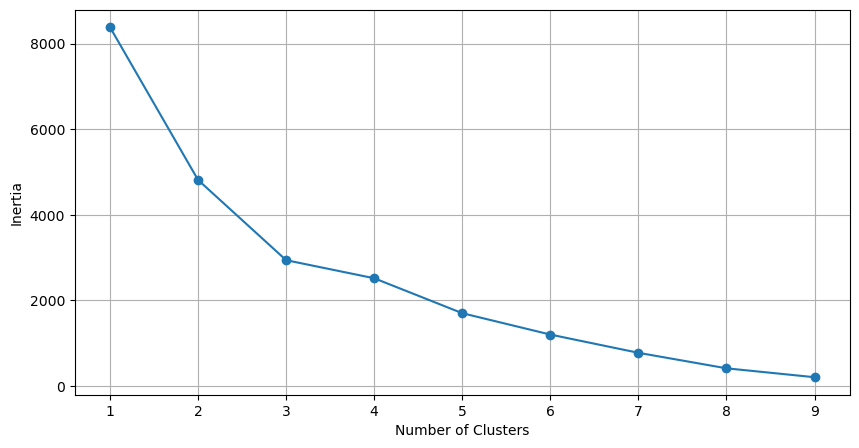

In [14]:
optimizeK(Vector_Embeddings, 10)

Through our graph we can see that inertia decreases rapidly as the number of clusters increase up until 3, after 3, the rate of decrease of inertia drops considerably. Therefore we will take 3 as the number of clusters

In [15]:
NumClusters = 3

In [16]:
kmeans = KMeans(n_clusters=NumClusters)
kmeans.fit(Vector_Embeddings)


KMeans(n_clusters=3)

Now we add a column to our Vector_Embeddings table that stores the cluster number of each image:

In [17]:
labels = (np.array(kmeans.labels_)).reshape(-1,1)

Vector_Embeddings = np.hstack((Vector_Embeddings, labels))

i.e: Cluster of image 4

In [18]:
print(Vector_Embeddings[3][768])

2.0


# Creating Folder Names

### Generating a description for each image using the image to text model Blip

#### Import libraries

In [19]:
import requests
from PIL import Image
from transformers import BlipProcessor, BlipForConditionalGeneration

#### Load pretrained model

In [20]:
processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-large")
model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-large")

#### Generate a description for each image

Function that returns the description for image inputted. We set the maximum number of new tokens generated as 10 as we want our folder names to be short so getting detailed descriptions would be reduntant and waste time and resources

In [21]:
def generateName(file_name):

    image = Image.open(file_name)
    inputs = processor(image, return_tensors='pt')

    with torch.no_grad():
        outputs = model.generate(**inputs, max_new_tokens=10)
        description = (processor.decode(outputs[0], skip_special_tokens=True))

    return description

Create a tuple that holds the cluster number and description of image and store that in an array named 'descriptions'. It will generate a maximum of 3 descriptions for each cluster to save computing power and improve efficiency and runtime

In [22]:
descriptions = []
ClustersGenerated = {}

for image in range(0, len(Vector_Embeddings)):
    
    cluster = Vector_Embeddings[image][768]

    if cluster in ClustersGenerated:
        ClustersGenerated[cluster] += 1
    else:
        ClustersGenerated[cluster] = 1

    if(ClustersGenerated[cluster] < 4):
        file_path = os.path.join(desktop_path, files[image])
        
        description = generateName(file_path)
        
        ClusterAndDescription = ((cluster) , (description))
        
        descriptions.append(ClusterAndDescription)

i.e: Cluster number and description of image 0

In [35]:
print(descriptions[0])

(0.0, 'sunset with a few clouds and a few trees in')


### Retrieving the most used noun from each cluster description

#### Import libraries

In [24]:
import nltk
from nltk.tokenize import word_tokenize
from nltk.tag import pos_tag

#### Create an array which holds all the nouns used to describe the images in each cluster

In [25]:
Clusterdesc = [[] for _ in range(NumClusters)]

for description in descriptions:

    tokens = word_tokenize(description[1])

    tagged_tokens = pos_tag(tokens)

    cluster = int(description[0])

    for token in tagged_tokens:
        if(token[1] == 'NN' or token[1] == 'NNS'):
                Clusterdesc[cluster].append(token[0])

Descriptions generated by Blip tend to hold redundant phrases such as 'an image of' or 'with a ___ background' so we remove those nouns from our dataset

In [26]:
for row in Clusterdesc:
    while 'background' in row:
        row.remove('background')
    while 'image' in row:
        row.remove('image')

i.e: Nouns used to describe images in Cluster 0:

In [27]:
print(Clusterdesc[0])

['sunset', 'clouds', 'trees', 'sunset', 'plane', 'sky', 'clouds', 'sunset', 'lone', 'tree', 'birds']


#### Find the most used noun for each cluster

We create a function that makes a dictionary storing the word and number of times it's used, it then returns the most used word (If two words are used the same amount of times the the function will return the first one it encounters in the dictionary). We pass each cluster through the function and the most used word from each cluster is stored in an array 'foldernames'

In [28]:
foldernames = []

def MostRepeatedWord(array):
    Count = {}
    for word in array:
        if word in Count:
            Count[word] += 1
        else:
            Count[word] = 1

    return max(Count, key=Count.get)

for clusters in Clusterdesc:
    word = MostRepeatedWord(clusters)
    foldernames.append(word)

In [29]:
print(foldernames)

['sunset', 'car', 'galaxy']


# Moving images to corresponding folder

#### Import library

In [30]:
import shutil

#### Create new folders and store images in them

Create a function that takes in a folder name and creates a new folder with that name on the desktop

In [31]:
def create_folder(folder_name):
    folder_path = os.path.join(desktop_path, folder_name)
    os.makedirs(folder_path, exist_ok=True) 
    return folder_path

Pass each folder name found earlier through the the function and create a folder with the name + " Photo(s)"

In [32]:
for folders in foldernames:
    foldername = folders + " Photo(s)"
    create_folder(foldername)

Move each image to it's corresponding cluster's folder

In [33]:
for file in range(0, len(files)):
    
    file_path = os.path.join(desktop_path, files[file])

    cluster = int(Vector_Embeddings[file][768])

    folder_path = os.path.join(desktop_path, foldernames[cluster] + " Photo(s)")

    shutil.move(file_path, folder_path)


# Final Product

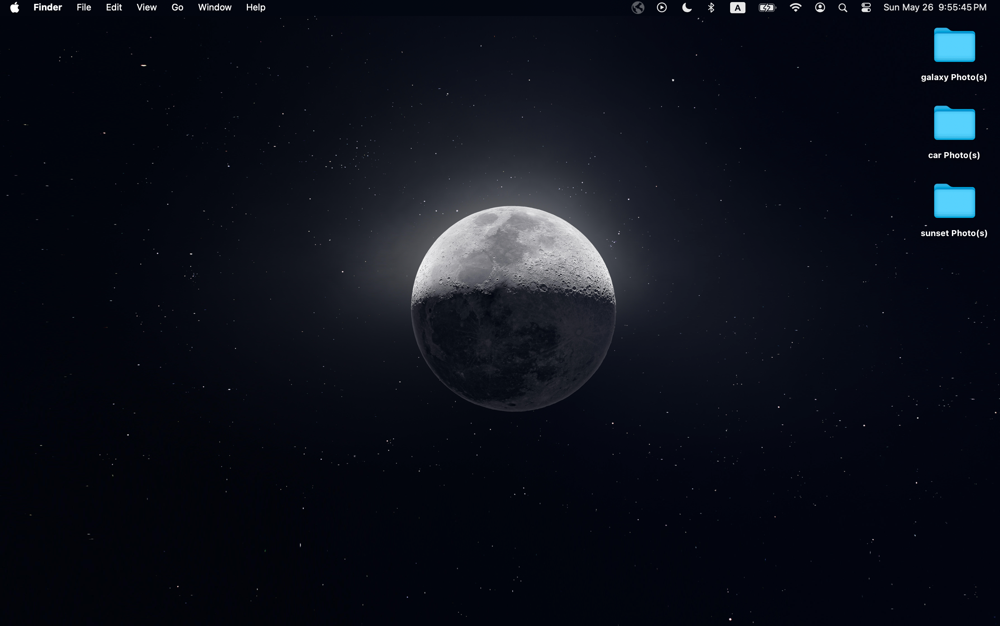

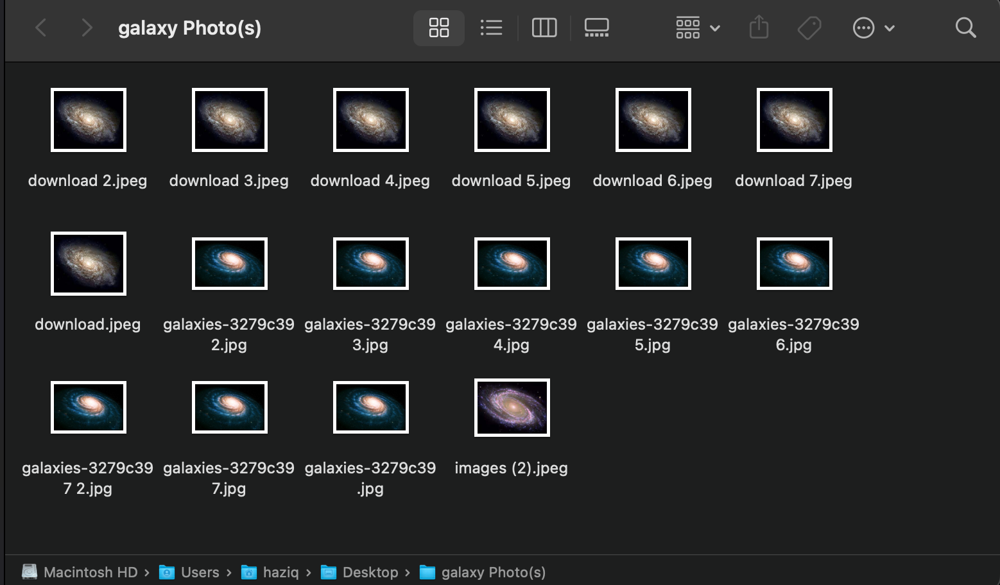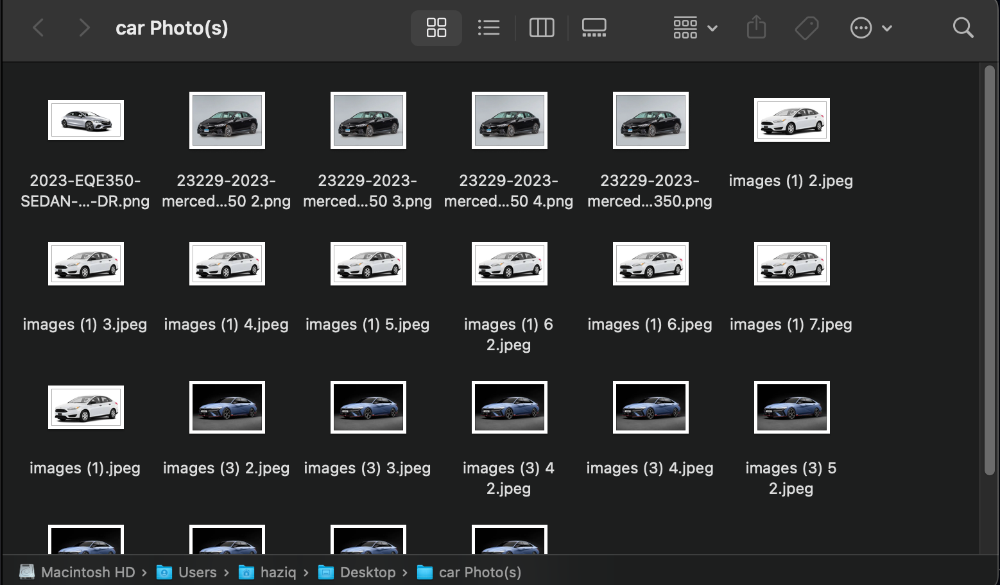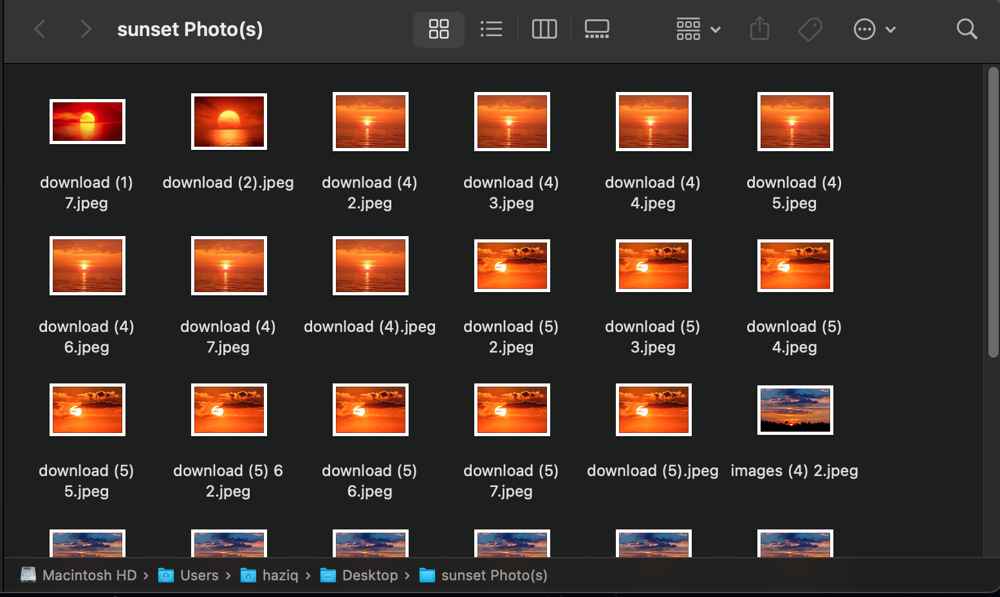

# Limitations

On some occasions, the method of finding nouns from each description can sometimes yield the wrong results, a LLM could be fed the descriptions and used to find an appropriate folder name for each cluster.

Furthermore, sometimes the organizer can falsely sort certain images